# Introduction

**Traffic Light Detection using YOLOv8**

In [1]:
"""
For cloud environments.
"""
!pip install matplotlib
!pip install pycocotools
!pip uninstall opencv-python -y
!pip uninstall opencv-python-headless -y
!pip install opencv-python-headless

Found existing installation: opencv-python 4.8.0.76
Uninstalling opencv-python-4.8.0.76:
  Successfully uninstalled opencv-python-4.8.0.76
Found existing installation: opencv-python-headless 4.9.0.80
Uninstalling opencv-python-headless-4.9.0.80:
  Successfully uninstalled opencv-python-headless-4.9.0.80
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 MB 32.4 MB/s eta 0:00:00


In [2]:
!pip install keras-cv==0.5.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 742.0/742.0 kB 11.0 MB/s eta 0:00:00


In [3]:
!pip install keras-core

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 6.0 MB/s eta 0:00:00


## Imports

In [4]:
import os
import xml.etree.ElementTree as ET
import tensorflow as tf
import keras_cv
import requests
import zipfile

from tqdm.auto import tqdm
from tensorflow import keras
from keras_cv import bounding_box
from keras_cv import visualization

## Download Dataset

In [5]:
# Download dataset.
def download_file(url, save_name):
    if not os.path.exists(save_name):
        print(f"Downloading file")
        file = requests.get(url, stream=True)
        total_size = int(file.headers.get('content-length', 0))
        block_size = 1024
        progress_bar = tqdm(
            total=total_size,
            unit='iB',
            unit_scale=True
        )
        with open(os.path.join(save_name), 'wb') as f:
            for data in file.iter_content(block_size):
                progress_bar.update(len(data))
                f.write(data)
        progress_bar.close()
    else:
        print('File already present')

download_file(
    'https://www.dropbox.com/scl/fi/suext2oyjxa0v4p78bj3o/S2TLD_720x1280.zip?rlkey=iequuynn54uib0uhsc7eqfci4&dl=1',
    'S2TLD_720x1280.zip'
)

  0%|          | 0.00/1.12G [00:00<?, ?iB/s]

In [6]:
# Unzip the data file
def unzip(zip_file=None):
    try:
        with zipfile.ZipFile(zip_file) as z:
            z.extractall("./")
            print("Extracted all")
    except:
        print("Invalid file")

unzip('S2TLD_720x1280.zip')

Extracted all


## Dataset and Training Parameters

In [7]:
SPLIT_RATIO = 0.2
BATCH_SIZE = 8
LEARNING_RATE = 0.0001
EPOCH = 75
GLOBAL_CLIPNORM = 10.0
IMG_SIZE = (640, 640)

## Dataset Preparation

In [8]:
class_ids = [
    "red",
    "yellow",
    "green",
    "off",
]
class_mapping = dict(zip(range(len(class_ids)), class_ids))

# Path to images and annotations
path_images = "S2TLD_720x1280/images/"
path_annot = "S2TLD_720x1280/annotations/"

# Get all XML file paths in path_annot and sort them
xml_files = sorted(
    [
        os.path.join(path_annot, file_name)
        for file_name in os.listdir(path_annot)
        if file_name.endswith(".xml")
    ]
)

# Get all JPEG image file paths in path_images and sort them
jpg_files = sorted(
    [
        os.path.join(path_images, file_name)
        for file_name in os.listdir(path_images)
        if file_name.endswith(".jpg")
    ]
)

In [9]:
def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    image_name = root.find("filename").text
    image_path = os.path.join(path_images, image_name)

    boxes = []
    classes = []
    for obj in root.iter("object"):
        cls = obj.find("name").text
        classes.append(cls)

        bbox = obj.find("bndbox")
        xmin = float(bbox.find("xmin").text)
        ymin = float(bbox.find("ymin").text)
        xmax = float(bbox.find("xmax").text)
        ymax = float(bbox.find("ymax").text)
        boxes.append([xmin, ymin, xmax, ymax])

    class_ids = [
        list(class_mapping.keys())[list(class_mapping.values()).index(cls)]
        for cls in classes
    ]
    return image_path, boxes, class_ids


image_paths = []
bbox = []
classes = []
for xml_file in tqdm(xml_files):
    image_path, boxes, class_ids = parse_annotation(xml_file)
    image_paths.append(image_path)
    bbox.append(boxes)
    classes.append(class_ids)

  0%|          | 0/4564 [00:00<?, ?it/s]

In [10]:
bbox = tf.ragged.constant(bbox)
classes = tf.ragged.constant(classes)
image_paths = tf.ragged.constant(image_paths)

data = tf.data.Dataset.from_tensor_slices((image_paths, classes, bbox))

In [11]:
# Determine the number of validation samples
num_val = int(len(xml_files) * SPLIT_RATIO)

# Split the dataset into train and validation sets
val_data = data.take(num_val)
train_data = data.skip(num_val)

In [12]:
def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    return image


def load_dataset(image_path, classes, bbox):
    # Read Image
    image = load_image(image_path)
    bounding_boxes = {
        "classes": tf.cast(classes, dtype=tf.float32),
        "boxes": bbox,
    }
    return {"images": tf.cast(image, tf.float32), "bounding_boxes": bounding_boxes}

In [13]:
augmenter = keras.Sequential(
    layers=[
        keras_cv.layers.RandomFlip(mode="horizontal", bounding_box_format="xyxy"),
        # keras_cv.layers.RandomGaussianBlur(kernel_size=(3, 3), factor=(0.5, 0.5)),
        # keras_cv.layers.RandomBrightness(factor=(0.5, 0.5)),
        # keras_cv.layers.RandomContrast(value_range=(0, 255), factor=(0.1, 0.9)),
        keras_cv.layers.JitteredResize(
            target_size=IMG_SIZE,
            scale_factor=(0.75, 1.3),
            bounding_box_format="xyxy",
        ),
    ]
)

In [14]:
train_ds = train_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.shuffle(BATCH_SIZE * 4)
train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
train_ds = train_ds.map(augmenter, num_parallel_calls=tf.data.AUTOTUNE)

In [15]:
resizing = keras_cv.layers.JitteredResize(
    target_size=IMG_SIZE,
    scale_factor=(1.0, 1.0),
    bounding_box_format="xyxy",
)

val_ds = val_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.shuffle(BATCH_SIZE * 4)
val_ds = val_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
val_ds = val_ds.map(resizing, num_parallel_calls=tf.data.AUTOTUNE)

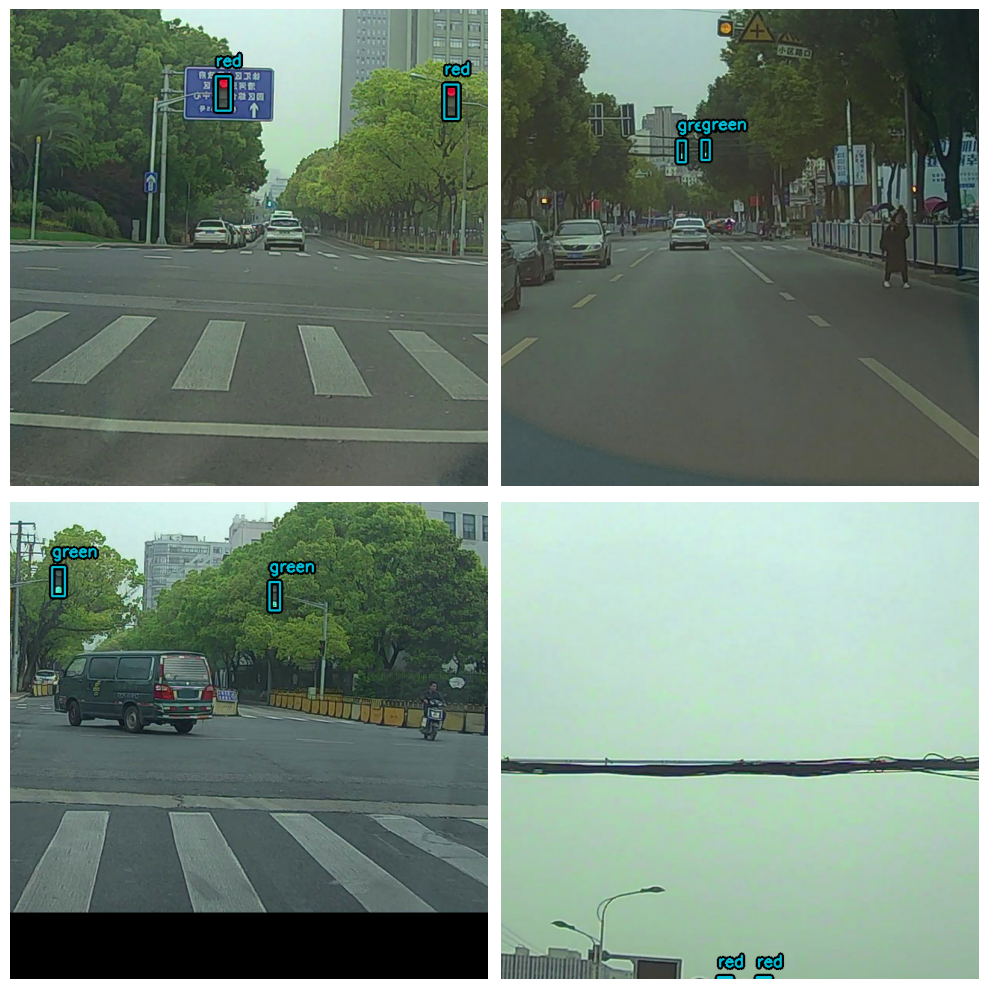

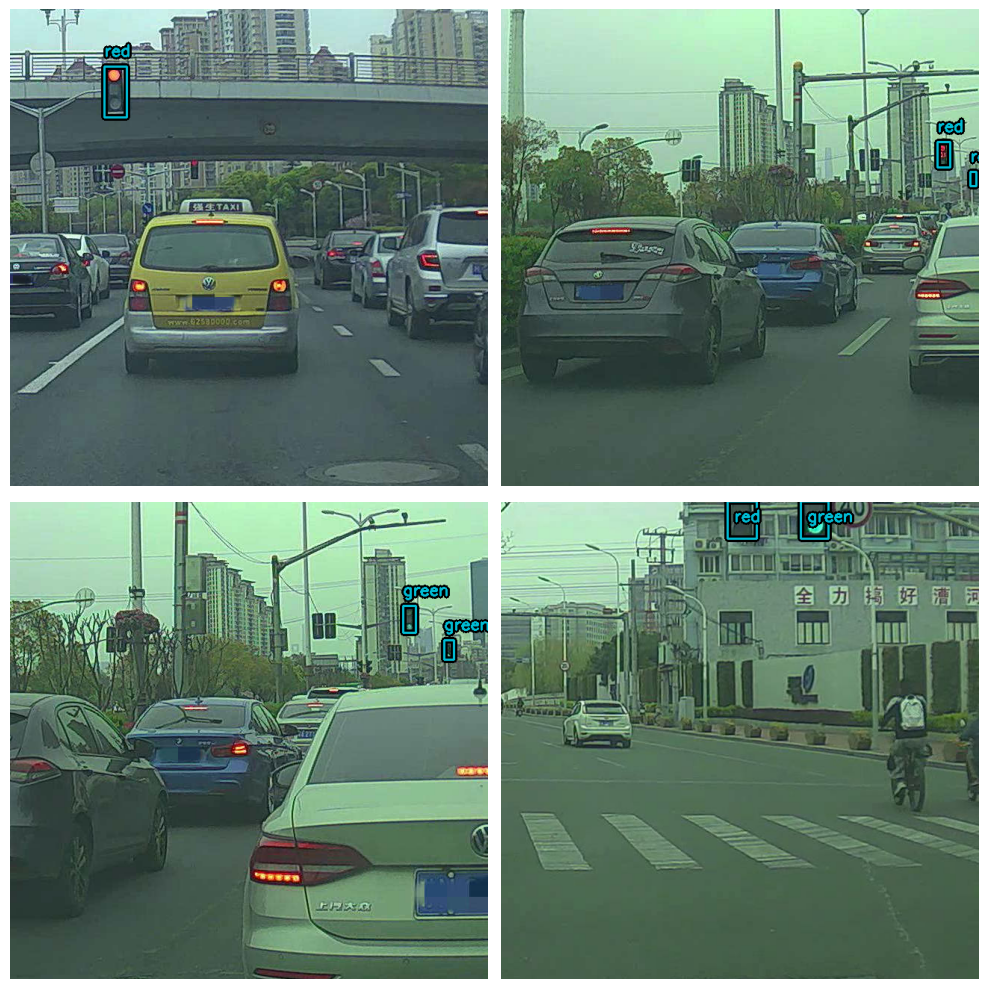

In [16]:

def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.7,
        bounding_box_format=bounding_box_format,
        class_mapping=class_mapping,
    )


visualize_dataset(
    train_ds, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2
)

visualize_dataset(
    val_ds, bounding_box_format="xyxy", value_range=(0, 255), rows=2, cols=2
)

In [17]:
def dict_to_tuple(inputs):
    return inputs["images"], inputs["bounding_boxes"]


train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.prefetch(tf.data.AUTOTUNE)

val_ds = val_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.prefetch(tf.data.AUTOTUNE)

## YOLOv8 Model

In [18]:
backbone = keras_cv.models.YOLOV8Backbone.from_preset(
    "yolo_v8_xs_backbone_coco",
    load_weights=True
)

5347160/5347160 [==============================] - 1s 0us/step


In [19]:
yolo = keras_cv.models.YOLOV8Detector(
    num_classes=len(class_mapping),
    bounding_box_format="xyxy",
    backbone=backbone,
    fpn_depth=3,
)

In [20]:
yolo.summary()

Model: "yolov8_detector"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 model (Functional)          {'P3': (None, None, None,    1277680   ['input_2[0][0]']             
                             64),                                                                 
                              'P4': (None, None, None,                                            
                             128),                                                                
                              'P5': (None, None, None,                                            
                             256)}                                                  

In [21]:
optimizer = tf.keras.optimizers.Adam(
    learning_rate=LEARNING_RATE,
    global_clipnorm=GLOBAL_CLIPNORM,
)

yolo.compile(
    optimizer=optimizer, classification_loss="binary_crossentropy", box_loss="ciou"
)

## Evaluation Metrics

In [22]:
class EvaluateCOCOMetricsCallback(keras.callbacks.Callback):
    def __init__(self, data, save_path):
        super().__init__()
        self.data = data
        self.metrics = keras_cv.metrics.BoxCOCOMetrics(
            bounding_box_format="xyxy",
            evaluate_freq=1e9,
        )

        self.save_path = save_path
        self.best_map = -1.0

    def on_epoch_end(self, epoch, logs):
        self.metrics.reset_state()
        for batch in self.data:
            images, y_true = batch[0], batch[1]
            y_pred = self.model.predict(images, verbose=0)
            self.metrics.update_state(y_true, y_pred)

        metrics = self.metrics.result(force=True)
        logs.update(metrics)

        current_map = metrics["MaP"]
        if current_map > self.best_map:
            self.best_map = current_map
            self.model.save(self.save_path)  # Save the model when mAP improves

        return logs

## Tensorboard Callback

In [23]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="logs_yolov8small")

## Training

In [24]:
history = yolo.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCH,
    callbacks=[
        EvaluateCOCOMetricsCallback(val_ds, "model_yolov8small.h5"),
        tensorboard_callback
    ],
)

Epoch 1/75
  6/456 [..............................] - ETA: 46s - loss: 11933.5674 - box_loss: 6.4343 - class_loss: 11927.1338

456/456 [==============================] - ETA: 0s - loss: 1738.4701 - box_loss: 4.3205 - class_loss: 1734.1490

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


456/456 [==============================] - 200s 325ms/step - loss: 1738.4701 - box_loss: 4.3205 - class_loss: 1734.1490 - val_loss: 369.7100 - val_box_loss: 3.0360 - val_class_loss: 366.6740 - MaP: 4.2348e-05 - MaP@[IoU=50]: 2.1884e-04 - MaP@[IoU=75]: 1.2651e-06 - MaP@[area=small]: 9.1912e-06 - MaP@[area=medium]: 1.4836e-04 - MaP@[area=large]: 1.1737e-04 - Recall@[max_detections=1]: 8.1463e-04 - Recall@[max_detections=10]: 0.0034 - Recall@[max_detections=100]: 0.0058 - Recall@[area=small]: 1.4632e-04 - Recall@[area=medium]: 0.0112 - Recall@[area=large]: 0.0190
Epoch 2/75
456/456 [==============================] - 139s 300ms/step - loss: 195.8951 - box_loss: 2.2641 - class_loss: 193.6311 - val_loss: 103.8840 - val_box_loss: 2.2846 - val_class_loss: 101.5995 - MaP: 6.2407e-06 - MaP@[IoU=50]: 2.8013e-05 - MaP@[IoU=75]: 1.0078e-06 - MaP@[area=small]: 9.1676e-06 - MaP@[area=medium]: 1.4297e-05 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.0000e+00 - Recall@[max_detections=10

456/456 [==============================] - 139s 301ms/step - loss: 54.8967 - box_loss: 1.7425 - class_loss: 53.1541 - val_loss: 32.3321 - val_box_loss: 1.9219 - val_class_loss: 30.4102 - MaP: 0.0560 - MaP@[IoU=50]: 0.1079 - MaP@[IoU=75]: 0.0494 - MaP@[area=small]: 0.0559 - MaP@[area=medium]: 0.0677 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.0834 - Recall@[max_detections=10]: 0.1103 - Recall@[max_detections=100]: 0.1103 - Recall@[area=small]: 0.0835 - Recall@[area=medium]: 0.1350 - Recall@[area=large]: 0.0000e+00
Epoch 4/75
456/456 [==============================] - 141s 304ms/step - loss: 20.8044 - box_loss: 1.5347 - class_loss: 19.2697 - val_loss: 14.6249 - val_box_loss: 1.8771 - val_class_loss: 12.7479 - MaP: 0.0246 - MaP@[IoU=50]: 0.0507 - MaP@[IoU=75]: 0.0173 - MaP@[area=small]: 0.0421 - MaP@[area=medium]: 0.0347 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.0773 - Recall@[max_detections=10]: 0.1142 - Recall@[max_detections=100]: 0.1148 - Recall@[

456/456 [==============================] - 139s 302ms/step - loss: 4.3448 - box_loss: 1.3624 - class_loss: 2.9824 - val_loss: 3.9233 - val_box_loss: 1.6014 - val_class_loss: 2.3219 - MaP: 0.1102 - MaP@[IoU=50]: 0.1972 - MaP@[IoU=75]: 0.1081 - MaP@[area=small]: 0.0941 - MaP@[area=medium]: 0.1539 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.1478 - Recall@[max_detections=10]: 0.2281 - Recall@[max_detections=100]: 0.2281 - Recall@[area=small]: 0.1890 - Recall@[area=medium]: 0.2728 - Recall@[area=large]: 0.0000e+00
Epoch 7/75
456/456 [==============================] - 136s 294ms/step - loss: 2.9996 - box_loss: 1.3007 - class_loss: 1.6989 - val_loss: 3.5684 - val_box_loss: 1.6941 - val_class_loss: 1.8744 - MaP: 0.0759 - MaP@[IoU=50]: 0.1517 - MaP@[IoU=75]: 0.0589 - MaP@[area=small]: 0.1215 - MaP@[area=medium]: 0.1537 - MaP@[area=large]: 7.6015e-06 - Recall@[max_detections=1]: 0.1494 - Recall@[max_detections=10]: 0.2416 - Recall@[max_detections=100]: 0.2431 - Recall@[area=sma

456/456 [==============================] - 137s 298ms/step - loss: 1.9858 - box_loss: 1.2481 - class_loss: 0.7378 - val_loss: 2.4986 - val_box_loss: 1.7148 - val_class_loss: 0.7838 - MaP: 0.1801 - MaP@[IoU=50]: 0.3608 - MaP@[IoU=75]: 0.1354 - MaP@[area=small]: 0.1728 - MaP@[area=medium]: 0.2202 - MaP@[area=large]: 0.0000e+00 - Recall@[max_detections=1]: 0.1706 - Recall@[max_detections=10]: 0.2530 - Recall@[max_detections=100]: 0.2530 - Recall@[area=small]: 0.2334 - Recall@[area=medium]: 0.2751 - Recall@[area=large]: 0.0000e+00
Epoch 10/75
456/456 [==============================] - ETA: 0s - loss: 1.7283 - box_loss: 1.2170 - class_loss: 0.5113

456/456 [==============================] - 137s 297ms/step - loss: 1.7283 - box_loss: 1.2170 - class_loss: 0.5113 - val_loss: 2.2941 - val_box_loss: 1.6822 - val_class_loss: 0.6119 - MaP: 0.2013 - MaP@[IoU=50]: 0.3954 - MaP@[IoU=75]: 0.1616 - MaP@[area=small]: 0.1749 - MaP@[area=medium]: 0.2558 - MaP@[area=large]: 0.0019 - Recall@[max_detections=1]: 0.1758 - Recall@[max_detections=10]: 0.2644 - Recall@[max_detections=100]: 0.2644 - Recall@[area=small]: 0.2392 - Recall@[area=medium]: 0.2937 - Recall@[area=large]: 0.0278
Epoch 11/75
456/456 [==============================] - 139s 302ms/step - loss: 1.6022 - box_loss: 1.1976 - class_loss: 0.4046 - val_loss: 2.1413 - val_box_loss: 1.6486 - val_class_loss: 0.4927 - MaP: 0.2008 - MaP@[IoU=50]: 0.3990 - MaP@[IoU=75]: 0.1647 - MaP@[area=small]: 0.1730 - MaP@[area=medium]: 0.2522 - MaP@[area=large]: 0.0064 - Recall@[max_detections=1]: 0.1783 - Recall@[max_detections=10]: 0.2553 - Recall@[max_detections=100]: 0.2553 - Recall@[area=small]: 0.2178

456/456 [==============================] - 137s 297ms/step - loss: 1.5201 - box_loss: 1.1826 - class_loss: 0.3375 - val_loss: 2.0607 - val_box_loss: 1.6491 - val_class_loss: 0.4116 - MaP: 0.2122 - MaP@[IoU=50]: 0.4148 - MaP@[IoU=75]: 0.1695 - MaP@[area=small]: 0.2025 - MaP@[area=medium]: 0.2557 - MaP@[area=large]: 0.0101 - Recall@[max_detections=1]: 0.1905 - Recall@[max_detections=10]: 0.2777 - Recall@[max_detections=100]: 0.2777 - Recall@[area=small]: 0.2574 - Recall@[area=medium]: 0.3038 - Recall@[area=large]: 0.0644
Epoch 13/75
456/456 [==============================] - 137s 297ms/step - loss: 1.4830 - box_loss: 1.1905 - class_loss: 0.2926 - val_loss: 2.1067 - val_box_loss: 1.6488 - val_class_loss: 0.4578 - MaP: 0.1439 - MaP@[IoU=50]: 0.2848 - MaP@[IoU=75]: 0.1147 - MaP@[area=small]: 0.2091 - MaP@[area=medium]: 0.2238 - MaP@[area=large]: 0.0035 - Recall@[max_detections=1]: 0.1889 - Recall@[max_detections=10]: 0.2924 - Recall@[max_detections=100]: 0.2924 - Recall@[area=small]: 0.2638

456/456 [==============================] - 137s 297ms/step - loss: 1.4229 - box_loss: 1.1670 - class_loss: 0.2558 - val_loss: 1.8680 - val_box_loss: 1.5630 - val_class_loss: 0.3051 - MaP: 0.2390 - MaP@[IoU=50]: 0.4364 - MaP@[IoU=75]: 0.2241 - MaP@[area=small]: 0.2248 - MaP@[area=medium]: 0.2800 - MaP@[area=large]: 0.0467 - Recall@[max_detections=1]: 0.2067 - Recall@[max_detections=10]: 0.2956 - Recall@[max_detections=100]: 0.2956 - Recall@[area=small]: 0.2765 - Recall@[area=medium]: 0.3193 - Recall@[area=large]: 0.1185
Epoch 15/75
456/456 [==============================] - 136s 296ms/step - loss: 1.3799 - box_loss: 1.1499 - class_loss: 0.2300 - val_loss: 1.8990 - val_box_loss: 1.5980 - val_class_loss: 0.3010 - MaP: 0.2257 - MaP@[IoU=50]: 0.4251 - MaP@[IoU=75]: 0.2041 - MaP@[area=small]: 0.2124 - MaP@[area=medium]: 0.2933 - MaP@[area=large]: 0.0367 - Recall@[max_detections=1]: 0.2084 - Recall@[max_detections=10]: 0.3131 - Recall@[max_detections=100]: 0.3131 - Recall@[area=small]: 0.2773

456/456 [==============================] - 139s 301ms/step - loss: 1.3220 - box_loss: 1.1352 - class_loss: 0.1868 - val_loss: 1.8161 - val_box_loss: 1.5669 - val_class_loss: 0.2492 - MaP: 0.2574 - MaP@[IoU=50]: 0.4812 - MaP@[IoU=75]: 0.2412 - MaP@[area=small]: 0.2313 - MaP@[area=medium]: 0.3562 - MaP@[area=large]: 0.0734 - Recall@[max_detections=1]: 0.2707 - Recall@[max_detections=10]: 0.3842 - Recall@[max_detections=100]: 0.3842 - Recall@[area=small]: 0.2860 - Recall@[area=medium]: 0.4575 - Recall@[area=large]: 0.1951
Epoch 19/75
456/456 [==============================] - 142s 308ms/step - loss: 1.2979 - box_loss: 1.1205 - class_loss: 0.1773 - val_loss: 1.7377 - val_box_loss: 1.5097 - val_class_loss: 0.2280 - MaP: 0.2325 - MaP@[IoU=50]: 0.4321 - MaP@[IoU=75]: 0.2081 - MaP@[area=small]: 0.2550 - MaP@[area=medium]: 0.3252 - MaP@[area=large]: 0.0476 - Recall@[max_detections=1]: 0.2677 - Recall@[max_detections=10]: 0.3783 - Recall@[max_detections=100]: 0.3783 - Recall@[area=small]: 0.3229

456/456 [==============================] - 139s 301ms/step - loss: 1.2954 - box_loss: 1.1226 - class_loss: 0.1728 - val_loss: 1.7394 - val_box_loss: 1.5118 - val_class_loss: 0.2276 - MaP: 0.2825 - MaP@[IoU=50]: 0.5341 - MaP@[IoU=75]: 0.2558 - MaP@[area=small]: 0.2564 - MaP@[area=medium]: 0.3527 - MaP@[area=large]: 0.1566 - Recall@[max_detections=1]: 0.2874 - Recall@[max_detections=10]: 0.4023 - Recall@[max_detections=100]: 0.4023 - Recall@[area=small]: 0.3187 - Recall@[area=medium]: 0.4623 - Recall@[area=large]: 0.3280
Epoch 21/75
456/456 [==============================] - 139s 301ms/step - loss: 1.2916 - box_loss: 1.1252 - class_loss: 0.1664 - val_loss: 1.8088 - val_box_loss: 1.5777 - val_class_loss: 0.2311 - MaP: 0.2435 - MaP@[IoU=50]: 0.4550 - MaP@[IoU=75]: 0.2198 - MaP@[area=small]: 0.2189 - MaP@[area=medium]: 0.3525 - MaP@[area=large]: 0.0635 - Recall@[max_detections=1]: 0.2920 - Recall@[max_detections=10]: 0.3994 - Recall@[max_detections=100]: 0.3994 - Recall@[area=small]: 0.2695

456/456 [==============================] - 138s 300ms/step - loss: 1.2788 - box_loss: 1.1169 - class_loss: 0.1619 - val_loss: 1.6318 - val_box_loss: 1.4406 - val_class_loss: 0.1912 - MaP: 0.3187 - MaP@[IoU=50]: 0.5540 - MaP@[IoU=75]: 0.3326 - MaP@[area=small]: 0.2643 - MaP@[area=medium]: 0.3876 - MaP@[area=large]: 0.2324 - Recall@[max_detections=1]: 0.3075 - Recall@[max_detections=10]: 0.4275 - Recall@[max_detections=100]: 0.4275 - Recall@[area=small]: 0.3272 - Recall@[area=medium]: 0.5123 - Recall@[area=large]: 0.2722
Epoch 23/75
456/456 [==============================] - 142s 308ms/step - loss: 1.2677 - box_loss: 1.1100 - class_loss: 0.1577 - val_loss: 1.7087 - val_box_loss: 1.5121 - val_class_loss: 0.1966 - MaP: 0.3126 - MaP@[IoU=50]: 0.5597 - MaP@[IoU=75]: 0.3004 - MaP@[area=small]: 0.2675 - MaP@[area=medium]: 0.3845 - MaP@[area=large]: 0.1731 - Recall@[max_detections=1]: 0.3076 - Recall@[max_detections=10]: 0.4339 - Recall@[max_detections=100]: 0.4339 - Recall@[area=small]: 0.3407

456/456 [==============================] - 134s 291ms/step - loss: 1.2635 - box_loss: 1.1095 - class_loss: 0.1539 - val_loss: 1.7212 - val_box_loss: 1.5284 - val_class_loss: 0.1928 - MaP: 0.3213 - MaP@[IoU=50]: 0.5713 - MaP@[IoU=75]: 0.3110 - MaP@[area=small]: 0.2592 - MaP@[area=medium]: 0.3866 - MaP@[area=large]: 0.1696 - Recall@[max_detections=1]: 0.2914 - Recall@[max_detections=10]: 0.4193 - Recall@[max_detections=100]: 0.4193 - Recall@[area=small]: 0.3132 - Recall@[area=medium]: 0.4795 - Recall@[area=large]: 0.2625
Epoch 25/75
456/456 [==============================] - ETA: 0s - loss: 1.2568 - box_loss: 1.1046 - class_loss: 0.1522

456/456 [==============================] - 139s 301ms/step - loss: 1.2568 - box_loss: 1.1046 - class_loss: 0.1522 - val_loss: 1.7207 - val_box_loss: 1.5293 - val_class_loss: 0.1915 - MaP: 0.3463 - MaP@[IoU=50]: 0.6216 - MaP@[IoU=75]: 0.3403 - MaP@[area=small]: 0.2975 - MaP@[area=medium]: 0.4309 - MaP@[area=large]: 0.1720 - Recall@[max_detections=1]: 0.3273 - Recall@[max_detections=10]: 0.4433 - Recall@[max_detections=100]: 0.4433 - Recall@[area=small]: 0.3792 - Recall@[area=medium]: 0.5114 - Recall@[area=large]: 0.2327
Epoch 26/75
456/456 [==============================] - 137s 297ms/step - loss: 1.2477 - box_loss: 1.0989 - class_loss: 0.1488 - val_loss: 1.6452 - val_box_loss: 1.4559 - val_class_loss: 0.1893 - MaP: 0.2919 - MaP@[IoU=50]: 0.5242 - MaP@[IoU=75]: 0.2833 - MaP@[area=small]: 0.2513 - MaP@[area=medium]: 0.3984 - MaP@[area=large]: 0.1290 - Recall@[max_detections=1]: 0.3027 - Recall@[max_detections=10]: 0.4354 - Recall@[max_detections=100]: 0.4354 - Recall@[area=small]: 0.3116

KeyboardInterrupt: 

## Inference on Validation Images using the Trained Model

1/1 [==============================] - 0s 63ms/step


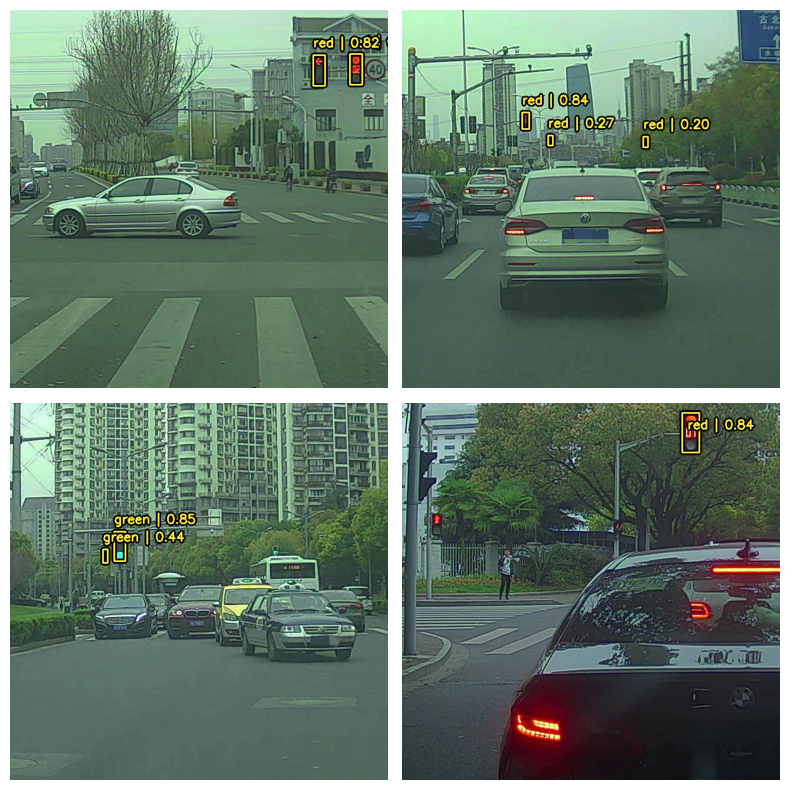

1/1 [==============================] - 0s 64ms/step


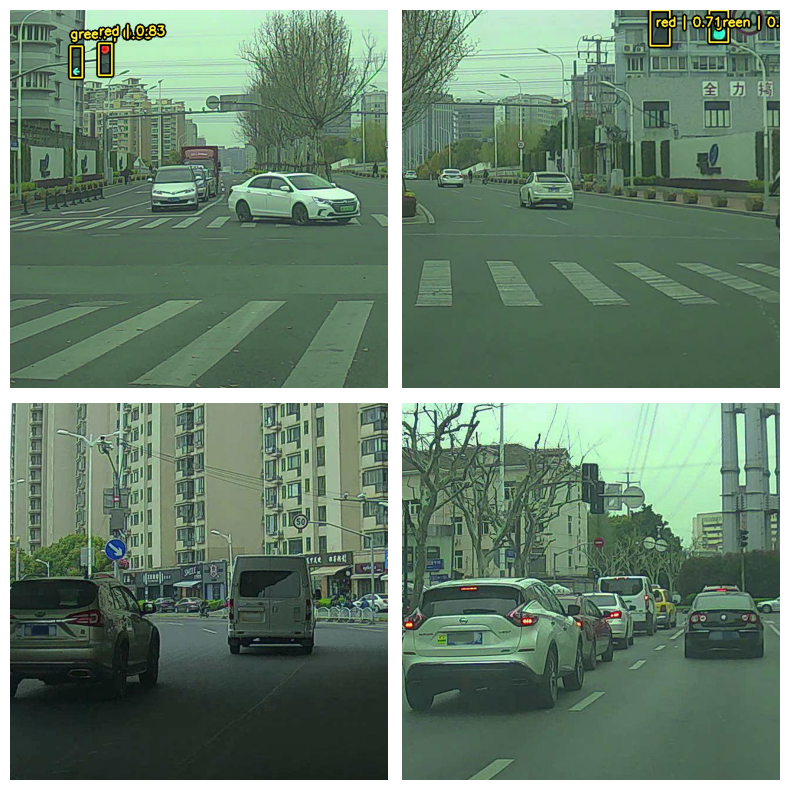

1/1 [==============================] - 0s 63ms/step


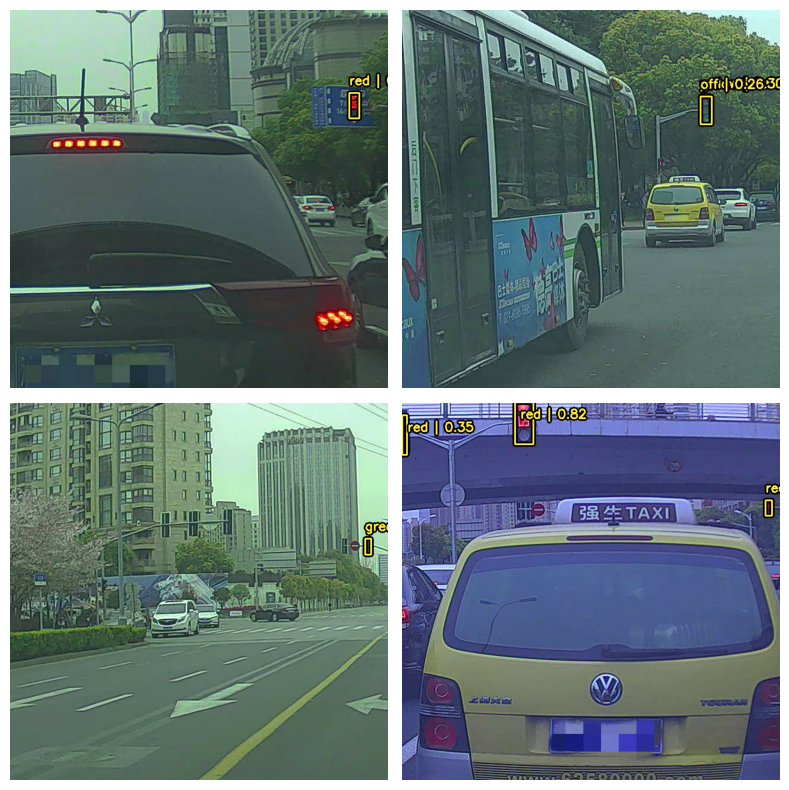

1/1 [==============================] - 0s 62ms/step


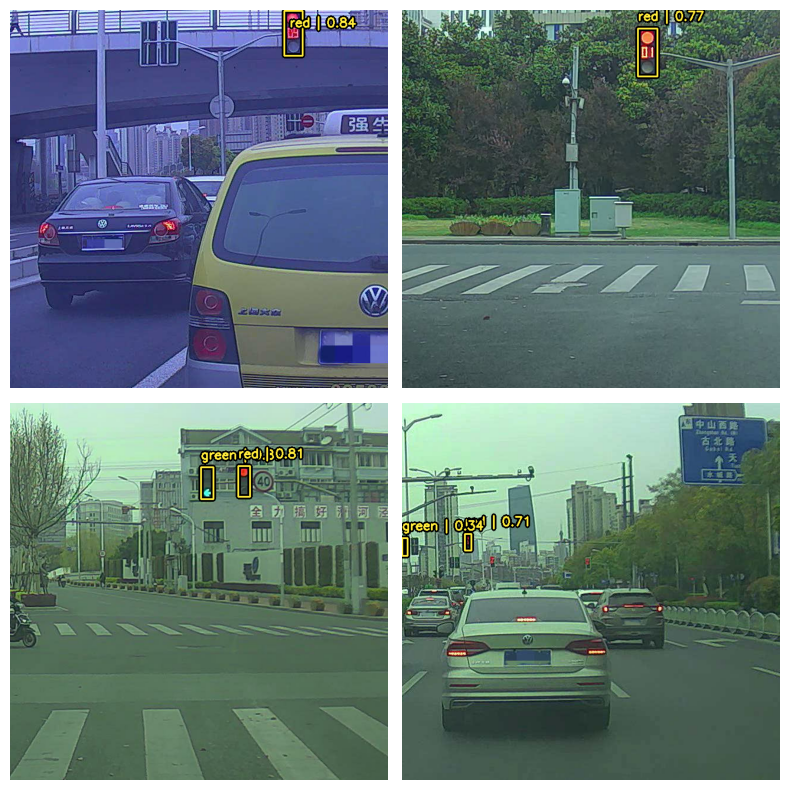

1/1 [==============================] - 0s 64ms/step


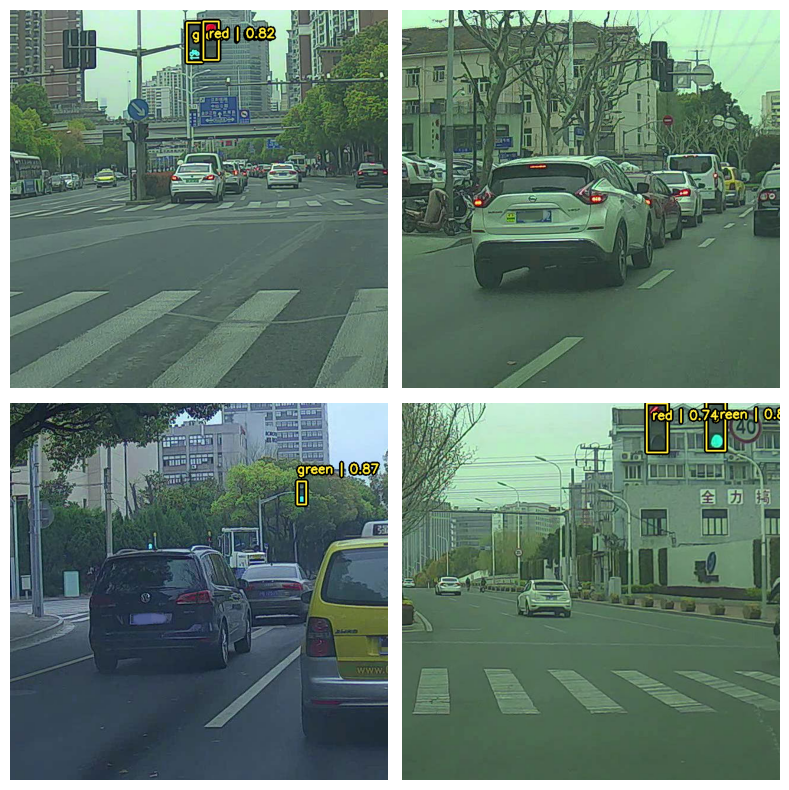

1/1 [==============================] - 0s 64ms/step


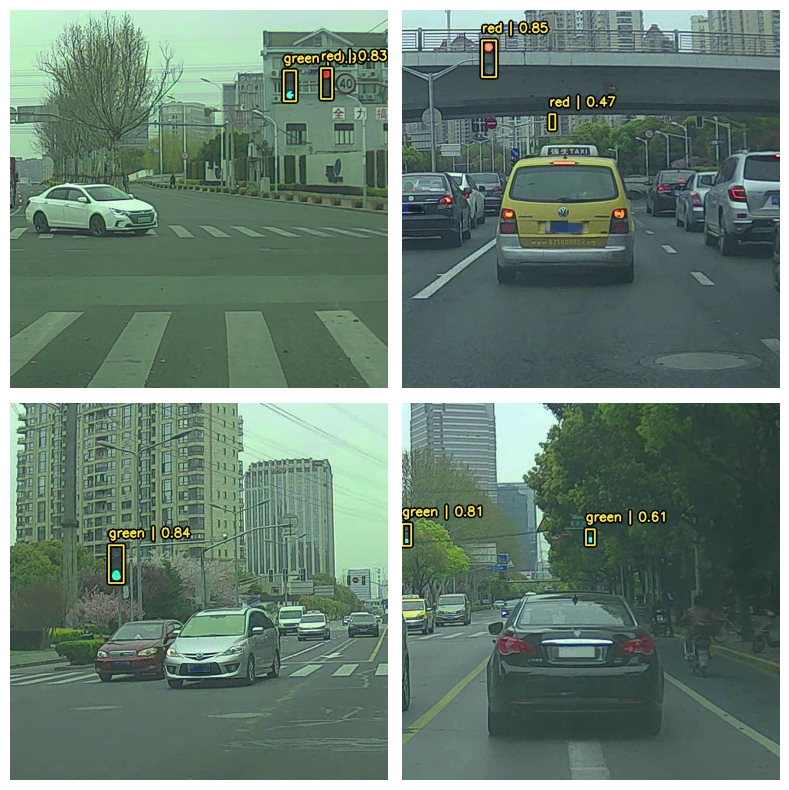

1/1 [==============================] - 0s 63ms/step


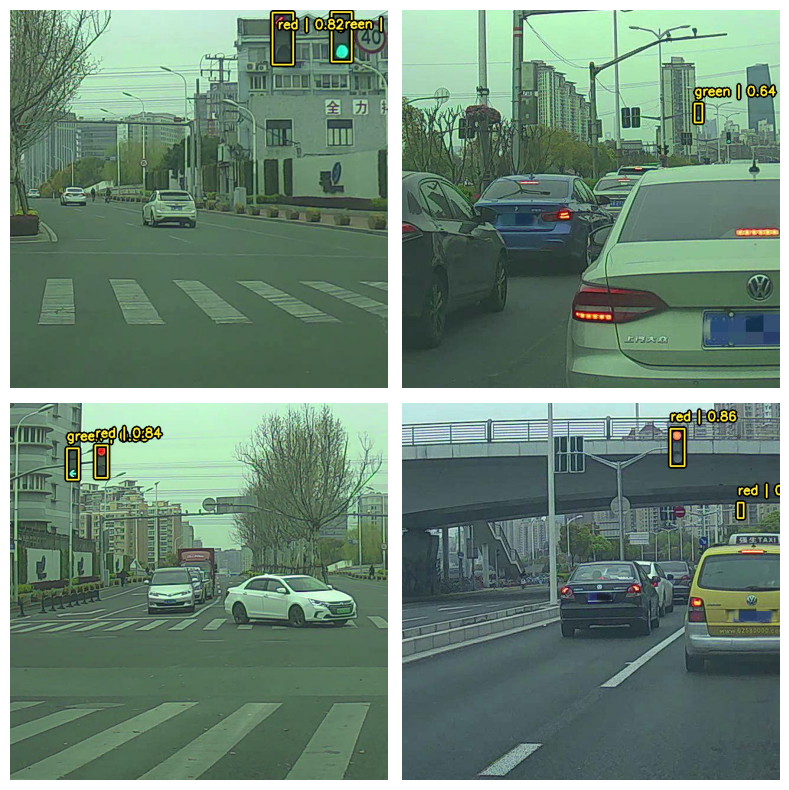

1/1 [==============================] - 0s 71ms/step


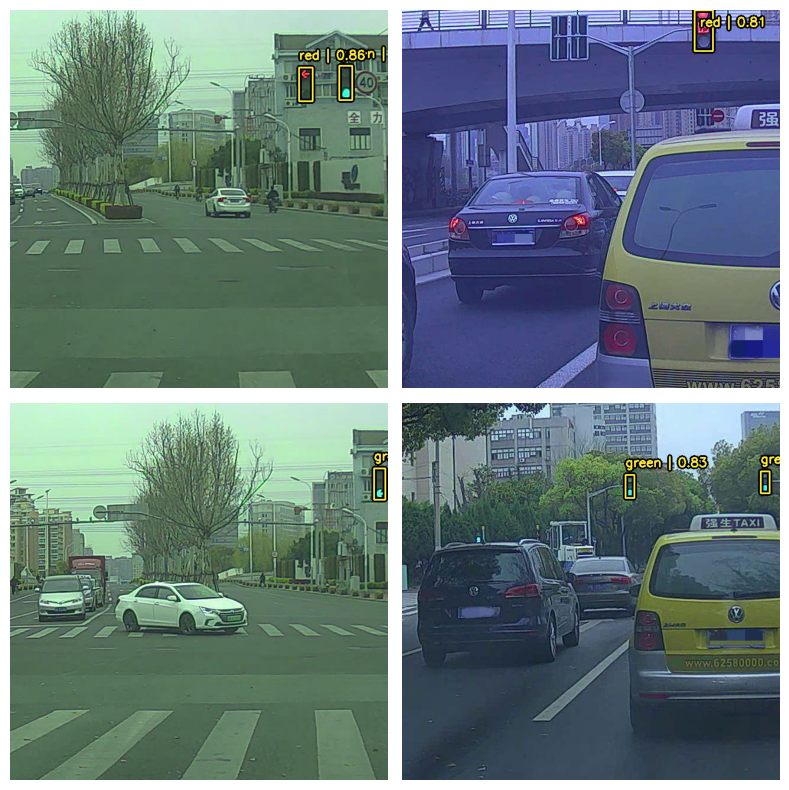

1/1 [==============================] - 0s 82ms/step


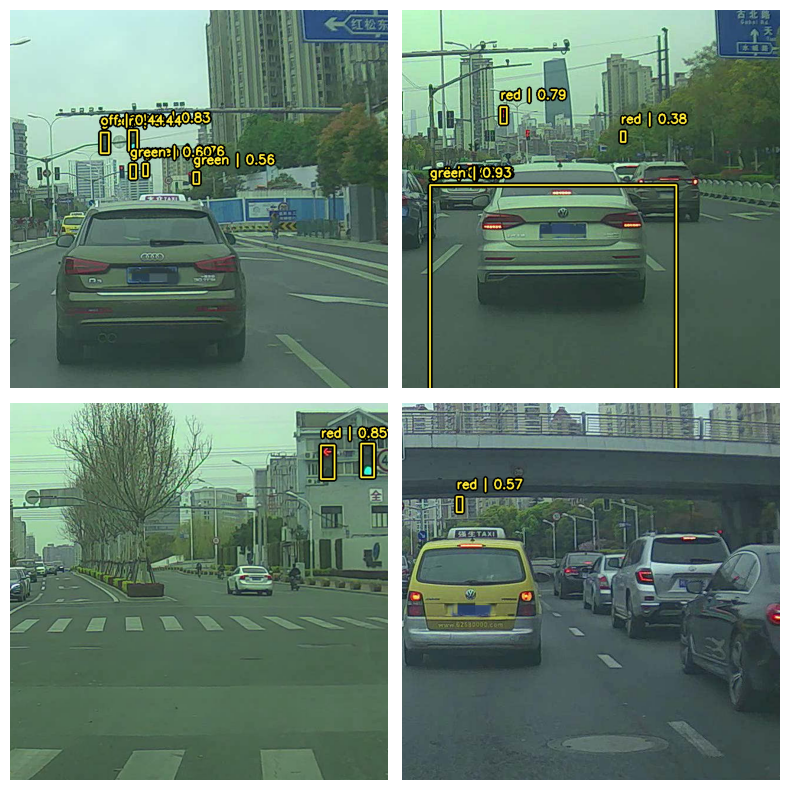

1/1 [==============================] - 0s 64ms/step


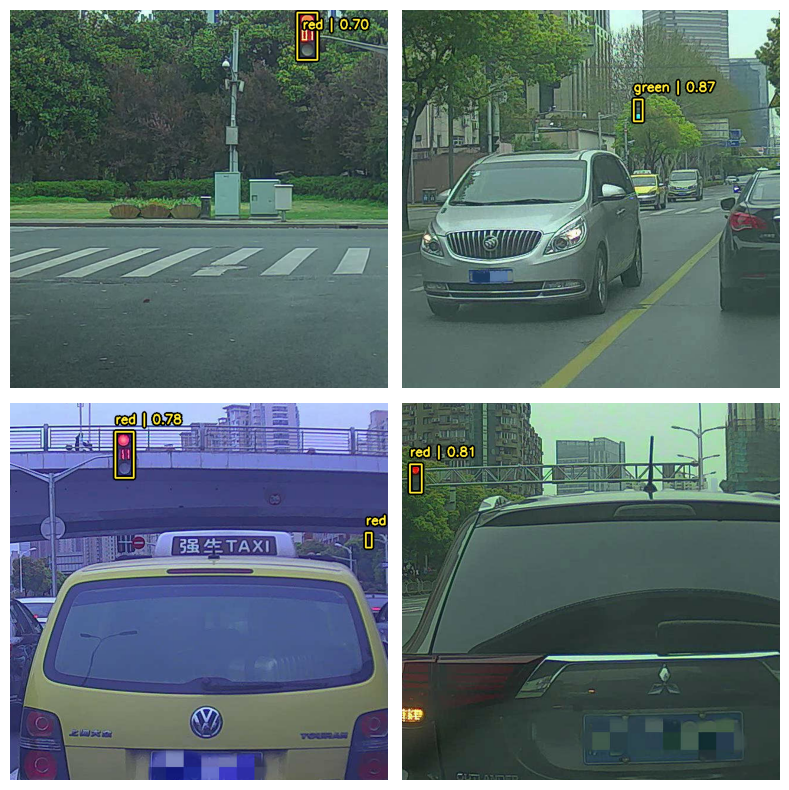

In [25]:
def visualize_detections(model, dataset, bounding_box_format):
    for i in range(10):
        images, y_true = next(iter(dataset.take(i+1)))
        y_pred = model.predict(images)
        y_pred = bounding_box.to_ragged(y_pred)
        visualization.plot_bounding_box_gallery(
            images,
            value_range=(0, 255),
            bounding_box_format=bounding_box_format,
            # y_true=y_true,
            y_pred=y_pred,
            scale=4,
            rows=2,
            cols=2,
            show=True,
            font_scale=0.7,
            class_mapping=class_mapping,
        )
visualize_detections(yolo, dataset=val_ds, bounding_box_format="xyxy")